In [1]:
import sys
import stlearn as st
st.settings.set_figure_params(dpi=300)
from pathlib import Path
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib
import sys
file = Path("../stimage").resolve()
parent= file.parent
sys.path.append(str(parent))
from PIL import Image
from stimage.utils import gene_plot, Read10X, ReadOldST
from stimage.model import CNN_NB_trainable
from stimage.data_generator import DataGenerator
import tensorflow as tf
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats
import numpy as np

In [2]:
BASE_PATH = Path("/clusterdata/uqxtan9/Xiao/STimage/dataset/breast_cancer_10x_visium")
TILE_PATH = Path("/tmp") / "tiles"
TILE_PATH.mkdir(parents=True, exist_ok=True)

SAMPLE = "block1"
Sample1 = st.Read10X(BASE_PATH / SAMPLE, 
                  library_id=SAMPLE, 
                  count_file="V1_Breast_Cancer_Block_A_Section_1_filtered_feature_bc_matrix.h5",
                  quality="fulres",)
                  #source_image_path=BASE_PATH / SAMPLE /"V1_Breast_Cancer_Block_A_Section_1_image.tif")
img = plt.imread(BASE_PATH / SAMPLE /"V1_Breast_Cancer_Block_A_Section_1_image.tif", 0)
Sample1.uns["spatial"][SAMPLE]['images']["fulres"] = img

SAMPLE = "block2"
Sample2 = st.Read10X(BASE_PATH / SAMPLE, 
                  library_id=SAMPLE, 
                  count_file="V1_Breast_Cancer_Block_A_Section_2_filtered_feature_bc_matrix.h5",
                  quality="fulres",)
                  #source_image_path=BASE_PATH / SAMPLE /"V1_Breast_Cancer_Block_A_Section_1_image.tif")
img = plt.imread(BASE_PATH / SAMPLE /"V1_Breast_Cancer_Block_A_Section_2_image.tif", 0)
Sample2.uns["spatial"][SAMPLE]['images']["fulres"] = img

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [3]:
gene_list=["SLITRK6", "PGM5", "LINC00645", 
           "TTLL12", "COX6C", "CPB1",
           "KRT5", "MALAT1"]
gene = gene_list[0]
print(gene)

SLITRK6


In [4]:
for adata in [
    Sample1,
    Sample2,
]:
#     count_df = adata.to_df()
#     count_df[count_df <=1] = 0
#     count_df[count_df >1] = 1
#     adata.X = count_df
#     adata[:,gene_list]
    st.pp.filter_genes(adata,min_cells=3)
    st.pp.normalize_total(adata)
    st.pp.log1p(adata)
#     st.pp.scale(adata)

    # pre-processing for spot image
    TILE_PATH_ = TILE_PATH / list(adata.uns["spatial"].keys())[0]
    TILE_PATH_.mkdir(parents=True, exist_ok=True)
    st.pp.tiling(adata, TILE_PATH_, crop_size=299)

Normalization step is finished in adata.X
Log transformation step is finished in adata.X


Tiling image: 100%|██████████ [ time left: 00:00 ]


Normalization step is finished in adata.X
Log transformation step is finished in adata.X


Tiling image: 100%|██████████ [ time left: 00:00 ]


In [5]:
training_index = Sample1.obs.sample(frac=0.7, random_state=1).index
training_dataset = Sample1[training_index,].copy()

valid_index = Sample1.obs.index.isin(training_index)
valid_dataset = Sample1[~valid_index,].copy()

test_dataset = Sample2.copy()

train_gen = tf.data.Dataset.from_generator(
            lambda:DataGenerator(adata=training_dataset, 
                          genes=[gene], aug=True),
            output_types=(tf.float32, tf.float32), 
            output_shapes=([299,299,3], [1])
)
train_gen_ = train_gen.shuffle(buffer_size=500).batch(128).repeat(3).cache().prefetch(tf.data.experimental.AUTOTUNE)
valid_gen = tf.data.Dataset.from_generator(
            lambda:DataGenerator(adata=valid_dataset, 
                          genes=[gene]), 
            output_types=(tf.float32, tf.float32), 
            output_shapes=([299,299,3], [1])
)
valid_gen_ = valid_gen.shuffle(buffer_size=500).batch(128).repeat(3).cache().prefetch(tf.data.experimental.AUTOTUNE)
test_gen = tf.data.Dataset.from_generator(
            lambda:DataGenerator(adata=test_dataset, 
                          genes=[gene]), 
            output_types=(tf.float32, tf.float32), 
            output_shapes=([299,299,3], [1])
)
test_gen_ = test_gen.batch(1)

In [6]:
from tensorflow.keras.applications.vgg16 import VGG16, preprocess_input as preprocess_vgg16
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input as preprocess_resnet50
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Input, concatenate, Dropout, Lambda
from tensorflow.keras.models import Model
import tensorflow_probability as tfp
tf.compat.v1.enable_eager_execution()
tfd = tfp.distributions
tfb = tfp.bijectors
import six
from tensorflow.python.keras import backend as K
from tensorflow.python.keras.utils.tf_utils import is_tensor_or_variable

def ZINB_layer(out): 
    n = tf.squeeze(tf.math.softplus(out[:,0:1]))

    p = tf.squeeze(tf.math.sigmoid(out[:,1:2]))

    s = tf.math.sigmoid(out[:,2:3])

    probs = tf.concat([1-s, s], axis=1)
    
    mix = tfd.Mixture(
          cat=tfd.Categorical(probs=probs),
          components=[
          tfd.Deterministic(loc=tf.zeros_like(n)),
          tfd.NegativeBinomial(total_count=n, probs=p),
        ])
    return mix


def NLL(y_true, y_hat):
    return -y_hat.log_prob(tf.reshape(y_true,(-1,)))


class MeanMetricWrapper(tf.keras.metrics.Mean):
    def __init__(self, fn, name=None, dtype=None, **kwargs):
        super(MeanMetricWrapper, self).__init__(name=name, dtype=dtype)
        self._fn = fn
        self._fn_kwargs = kwargs
    def update_state(self, y_true, y_pred, sample_weight=None):
        matches = self._fn(y_true, y_pred, **self._fn_kwargs)
        return super(MeanMetricWrapper, self).update_state(
                     matches, sample_weight=sample_weight)
    def get_config(self):
        config = {}
        for k, v in six.iteritems(self._fn_kwargs):
            config[k] = K.eval(v) if is_tensor_or_variable(v) else v
        base_config = super(MeanMetricWrapper, self).get_config()
        return dict(list(base_config.items()) + list(config.items()))


def vgg16_ZINB(tile_shape):
    tile_input = Input(shape=tile_shape, name = "tile_input")
    VGG16_base = VGG16(input_tensor=tile_input, weights='imagenet', include_top=False)
    for layer in VGG16_base.layers:
        layer.trainable = False
    
    cnn = VGG16_base.output
    cnn = GlobalAveragePooling2D()(cnn)
    cnn = Dropout(0.5)(cnn)
    cnn = Dense(256, activation='relu', kernel_regularizer=tf.keras.regularizers.l1(0.01),
                activity_regularizer=tf.keras.regularizers.l2(0.01))(cnn)
    # cnn = Dense(256, activation='relu')(cnn)
    
    outputs = Dense(3)(cnn)

#     p_y_zinb = tfp.layers.DistributionLambda(zero_inf)(outputs)
    p_y_zinb = tfp.layers.DistributionLambda(ZINB_layer)(outputs)

    model = Model(inputs=tile_input, outputs=p_y_zinb)

#     optimizer = tf.keras.optimizers.RMSprop(0.001)
    optimizer = tf.keras.optimizers.Adam(0.001)

    model.compile(loss=NLL,
                  optimizer=optimizer,
                  metrics=[MeanMetricWrapper(NLL, name="nll")])    
    return model

In [7]:
def resnet_ZINB(tile_shape):
    tile_input = Input(shape=tile_shape, name = "tile_input")
    resnet_base = ResNet50(input_tensor=tile_input, weights='imagenet', include_top=False)
    stage_5_start = resnet_base.get_layer("conv5_block1_1_conv")
    for i in range(resnet_base.layers.index(stage_5_start)):
        resnet_base.layers[i].trainable = False
    
    cnn = resnet_base.output
    cnn = GlobalAveragePooling2D()(cnn)
    cnn = Dropout(0.5)(cnn)
    cnn = Dense(512, activation='relu', kernel_regularizer=tf.keras.regularizers.l1(0.01),
                activity_regularizer=tf.keras.regularizers.l2(0.01))(cnn)
    # cnn = Dense(256, activation='relu')(cnn)
    
    outputs = Dense(3)(cnn)

#     p_y_zinb = tfp.layers.DistributionLambda(zero_inf)(outputs)
    p_y_zinb = tfp.layers.DistributionLambda(ZINB_layer)(outputs)

    model = Model(inputs=tile_input, outputs=p_y_zinb)

#     optimizer = tf.keras.optimizers.RMSprop(0.001)
    optimizer = tf.keras.optimizers.Adam(0.001)

    model.compile(loss=NLL,
                  optimizer=optimizer,
                  metrics=[MeanMetricWrapper(NLL, name="nll")])    
    return model

In [18]:
# model = vgg16_ZINB((299, 299, 3))
model = resnet_ZINB((299, 299, 3))
callback = tf.keras.callbacks.EarlyStopping(monitor='val_nll', patience=20,
                                            restore_best_weights=False)

In [19]:
print(model.summary())

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
tile_input (InputLayer)         [(None, 299, 299, 3) 0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 305, 305, 3)  0           tile_input[0][0]                 
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, 150, 150, 64) 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
conv1_bn (BatchNormalization)   (None, 150, 150, 64) 256         conv1_conv[0][0]                 
____________________________________________________________________________________________

In [20]:
train_history = model.fit(train_gen_,
                          epochs=100,
                          validation_data=valid_gen_,
                          callbacks=[callback]
                          )

Epoch 1/100
63/63 [==============================] - 29s 401ms/step - loss: 144.1773 - nll: 1.0539 - val_loss: 5.1885 - val_nll: 1.0699
Epoch 2/100
63/63 [==============================] - 24s 382ms/step - loss: 3.5380 - nll: 0.9355 - val_loss: 2.4437 - val_nll: 0.9355
Epoch 3/100
63/63 [==============================] - 24s 384ms/step - loss: 2.2892 - nll: 0.8932 - val_loss: 2.3144 - val_nll: 0.9349
Epoch 4/100
63/63 [==============================] - 24s 384ms/step - loss: 2.1849 - nll: 0.8557 - val_loss: 2.2370 - val_nll: 0.8750
Epoch 5/100
63/63 [==============================] - 24s 384ms/step - loss: 2.1470 - nll: 0.8275 - val_loss: 2.2713 - val_nll: 0.9209
Epoch 6/100
63/63 [==============================] - 24s 383ms/step - loss: 2.1256 - nll: 0.8071 - val_loss: 2.2151 - val_nll: 0.8652
Epoch 7/100
63/63 [==============================] - 24s 382ms/step - loss: 2.1093 - nll: 0.7886 - val_loss: 2.3807 - val_nll: 1.0475
Epoch 8/100
63/63 [==============================] - 24s 382

In [21]:
model.save("./cnn_zinb_100epoch_04032021.h5")

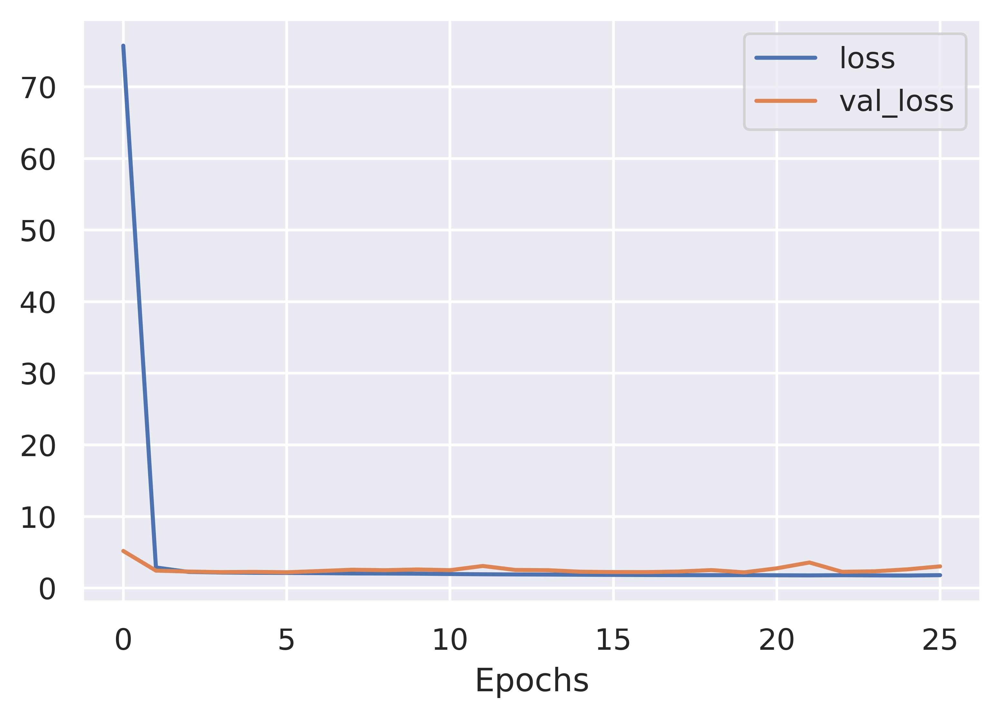

In [22]:
plt.plot(train_history.history['loss'])
plt.plot(train_history.history['val_loss'])
plt.legend(['loss', 'val_loss'])
plt.xlabel('Epochs')
plt.show()

In [23]:
test_predictions = model.predict(test_gen_)

test_dataset.obsm["predicted_gene"] = test_predictions

/scratch/imb/Xiao/STimage/stimage/utils.py:106: MatplotlibDeprecationWarning: The 'cmap' parameter to Colorbar has no effect because it is overridden by the mappable; it is deprecated since 3.3 and will be removed two minor releases later.
  vmax = max(colors)


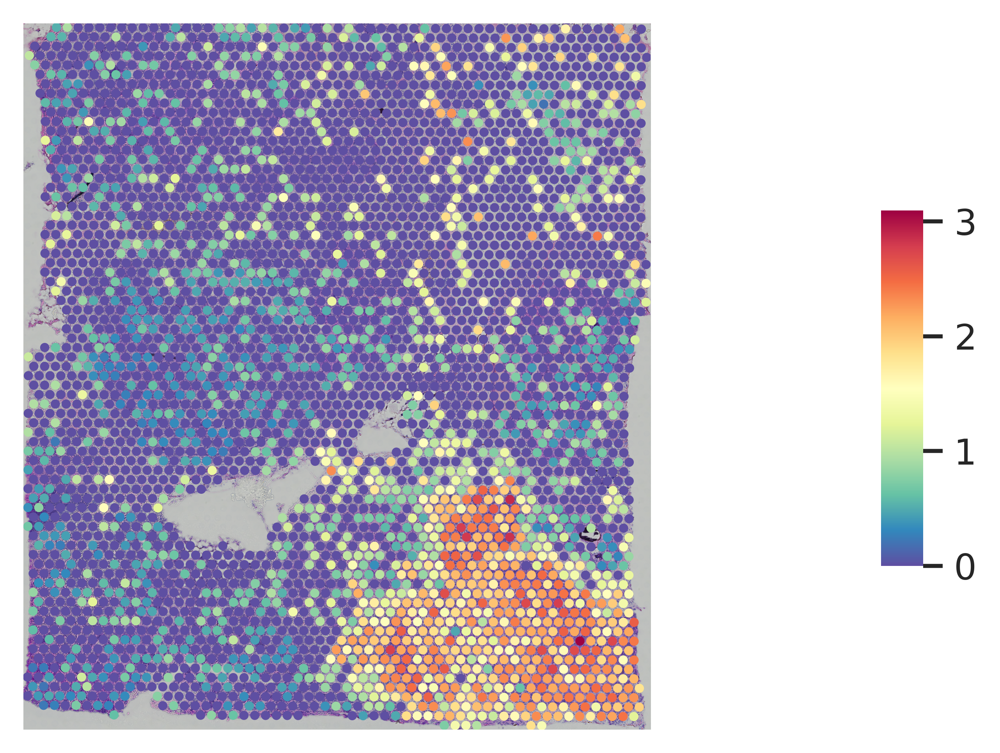

In [24]:
gene_plot(test_dataset, genes=gene, spot_size=8)

In [25]:
test_dataset_ = test_dataset[:,gene].copy()
test_dataset_.X = test_dataset_.obsm["predicted_gene"]

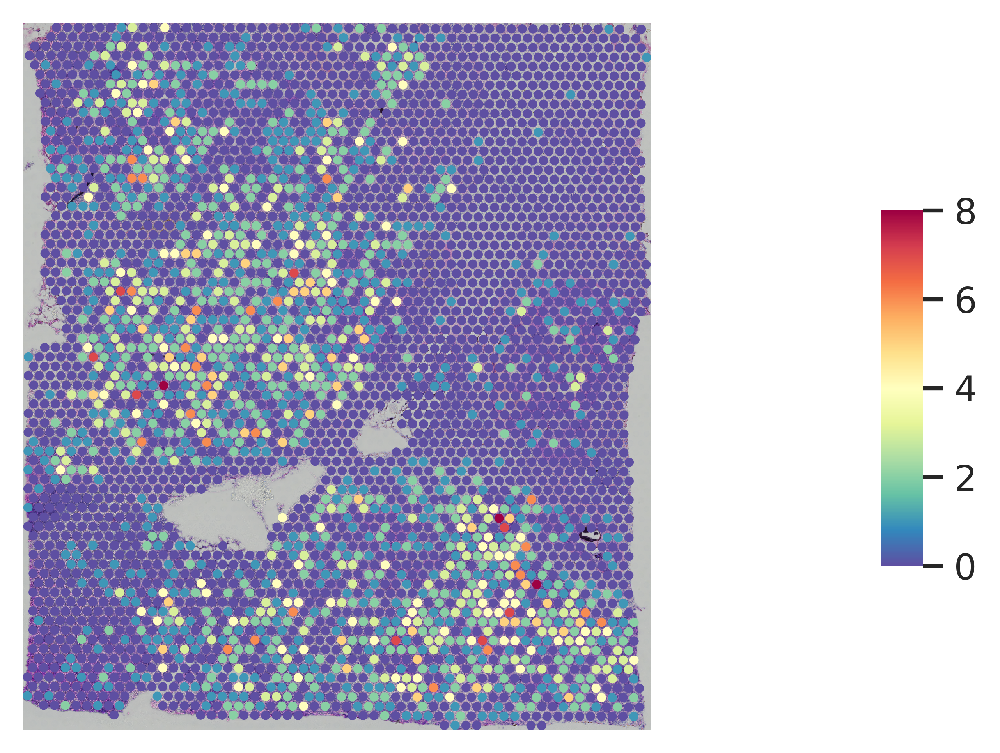

In [26]:
gene_plot(test_dataset_, genes=gene, spot_size=8)

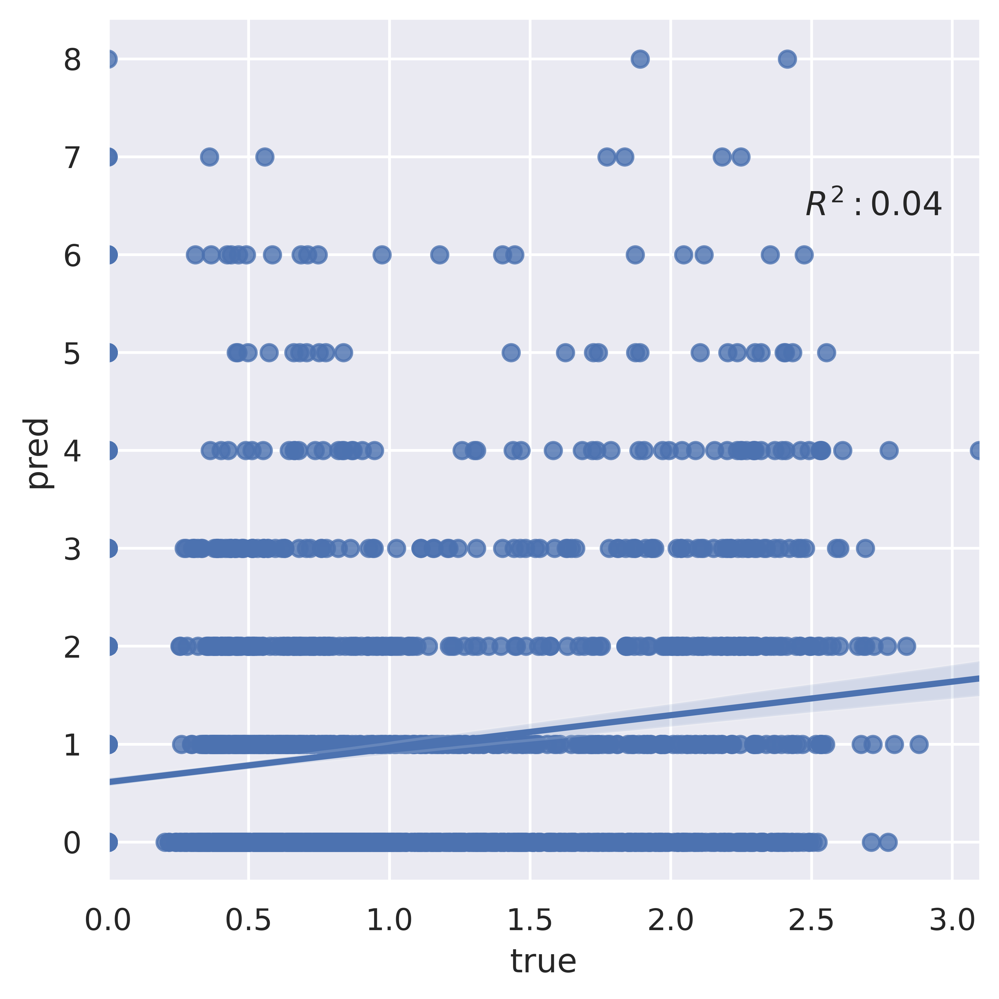

In [27]:
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats

true_y = np.array(test_dataset[:,gene].to_df()).ravel()
pred_y = np.array(test_dataset_[:,gene].to_df()).ravel()
df = pd.DataFrame({"true_y":true_y, "pred_y":pred_y})
r2 = stats.pearsonr(true_y, 
                    pred_y)[0] ** 2
sns.set_theme()
g = sns.lmplot(data=df,
    x="true_y", y="pred_y",
    height=5, legend=True
)
# g.set(ylim=(0, 360), xlim=(0,360))

g.set_axis_labels("true", "pred")
plt.annotate(r'$R^2:{0:.2f}$'.format(r2),
            (max(true_y)*0.8, max(pred_y)*0.8))
plt.show()